In [ ]:
!pip install kaggle

In [ ]:
import tensorflow as tf

# Check if a GPU is available
if tf.test.gpu_device_name():
    print('GPU device found:', tf.test.gpu_device_name())
else:
    print('No GPU device found. Using CPU.')


GPU device found: /device:GPU:0


In [ ]:
!nvidia-smi


Wed Jan 31 07:26:17 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   62C    P0              31W /  70W |    103MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
# prompt: !mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json   modify his to use here  kaggle.json is present in the same directory as the current file

from google.colab import files
import os

# Upload the kaggle.json file
uploaded = files.upload()

# Move the uploaded file to the ~/.kaggle/ directory
os.makedirs("/root/.kaggle/", exist_ok=True)
os.rename(list(uploaded.keys())[0], "/root/.kaggle/kaggle.json")

# Set the correct permissions
os.chmod("/root/.kaggle/kaggle.json", 600)


Saving kaggle.json to kaggle.json


In [ ]:
!kaggle datasets download -d gpiosenka/100-bird-species


100% 1.95G/1.96G [00:24<00:00, 142MB/s]
100% 1.96G/1.96G [00:24<00:00, 86.6MB/s]


In [ ]:
!unzip /content/100-bird-species.zip


Streaming output truncated to the last 5000 lines.
  inflating: train/WHITE TAILED TROPIC/120.jpg  
  inflating: train/WHITE TAILED TROPIC/121.jpg  
  inflating: train/WHITE TAILED TROPIC/122.jpg  
  inflating: train/WHITE TAILED TROPIC/123.jpg  
  inflating: train/WHITE TAILED TROPIC/124.jpg  
  inflating: train/WHITE TAILED TROPIC/125.jpg  
  inflating: train/WHITE TAILED TROPIC/126.jpg  
  inflating: train/WHITE TAILED TROPIC/127.jpg  
  inflating: train/WHITE TAILED TROPIC/128.jpg  
  inflating: train/WHITE TAILED TROPIC/129.jpg  
  inflating: train/WHITE TAILED TROPIC/130.jpg  
  inflating: train/WHITE TAILED TROPIC/131.jpg  
  inflating: train/WHITE TAILED TROPIC/132.jpg  
  inflating: train/WHITE TAILED TROPIC/133.jpg  
  inflating: train/WHITE TAILED TROPIC/134.jpg  
  inflating: train/WHITE TAILED TROPIC/135.jpg  
  inflating: train/WHITE TAILED TROPIC/136.jpg  
  inflating: train/WHITE TAILED TROPIC/137.jpg  
  inflating: train/WHITE TAILED TROPIC/138.jpg  
  inflating: train

In [ ]:
import os
import pandas as pd
import numpy as np
from numpy.random import seed
import matplotlib.pyplot as plt
import seaborn as sns
import random
from matplotlib.image import imread
from tqdm import tqdm
import pickle
import shutil

import tensorflow
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img,img_to_array
from tensorflow.keras.utils import plot_model,set_random_seed
from tensorflow.keras.backend import clear_session

from tensorflow.keras.models import Model,load_model
from tensorflow.keras.layers import Input,Conv2D,MaxPooling2D,Flatten,Dense,Dropout,DepthwiseConv2D,BatchNormalization,Concatenate,Add,Activation,SeparableConv2D,GlobalAveragePooling2D,GlobalMaxPooling2D
from tensorflow.keras.callbacks import ReduceLROnPlateau,ModelCheckpoint,TensorBoard,LearningRateScheduler,EarlyStopping
from tensorflow.keras.regularizers import L1,L2,L1L2
from tensorflow.keras.optimizers import Adam,SGD
%load_ext tensorboard

from tensorflow.keras.applications import VGG16,ResNet50,InceptionV3,EfficientNetB0,VGG19
from tensorflow.keras.applications.vgg16 import preprocess_input as vgg16_prep
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_prep
from tensorflow.keras.applications.inception_v3 import preprocess_input as incep_prep
from tensorflow.keras.applications.vgg19 import preprocess_input as vgg19_prep
from tensorflow.keras.applications.efficientnet import preprocess_input as eff_prep

from prettytable import PrettyTable
import cv2
from google.colab.patches import cv2_imshow

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
def get_counts(dataset_path,dataset_type):
  """Takes dataset's folder path and returns some basic details like species count, images count, height, width etc."""
  all_species_count = len(os.listdir(dataset_path))
  all_species_names=[]
  species_image_count=[]
  all_heights=[]
  all_widths=[]
  for i in tqdm(os.listdir(dataset_path)):
    all_species_names.append(i)
    species_folder_path = dataset_path + "/" + i + "/"
    species_image_count.append(len(os.listdir(species_folder_path)))
    for j in os.listdir(species_folder_path):
      filename = species_folder_path + j
      image = imread(filename)
      all_heights.append(image.shape[0])
      all_widths.append(image.shape[1])
  print()
  print(f"Total no. of species in {dataset_type}= {all_species_count}")
  return all_species_names,species_image_count,all_heights,all_widths

In [ ]:
# TRAIN
train_species_names,train_species_image_count,train_images_heights,train_images_widths = get_counts(dataset_path="/content/train/",dataset_type="train")


100%|██████████| 525/525 [01:06<00:00,  7.91it/s]


Total no. of species in train= 525


<Axes: title={'center': 'No. of images (Y-axis) for each Species (X-axis) in train dataset'}, xlabel='Species index', ylabel='No. of images'>

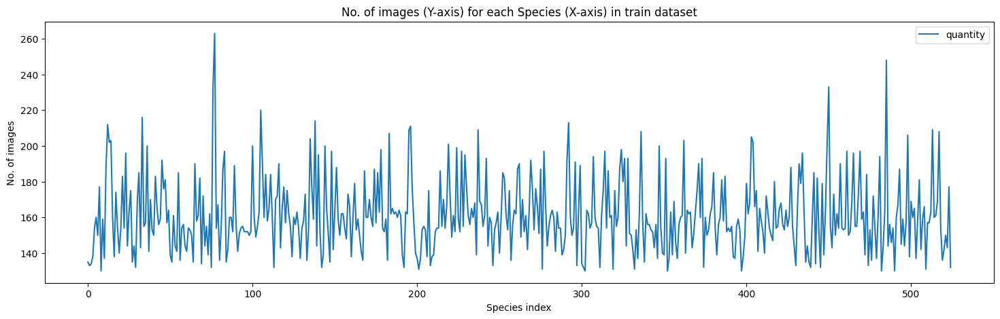

In [ ]:
# Using the indices 0-384 as x-axis since displaying 399 species names will make the plot cumbersome to read:-
df = pd.DataFrame({"species_name":train_species_names,
                   "quantity":train_species_image_count})
df.plot(kind="line",y="quantity",figsize=(18,5),title="No. of images (Y-axis) for each Species (X-axis) in train dataset",ylabel="No. of images",xlabel="Species index")


<Axes: title={'center': 'No. of species (Y-axis) VS No. of images (X-axis)'}, xlabel='No. of images', ylabel='No. of species having these many images'>

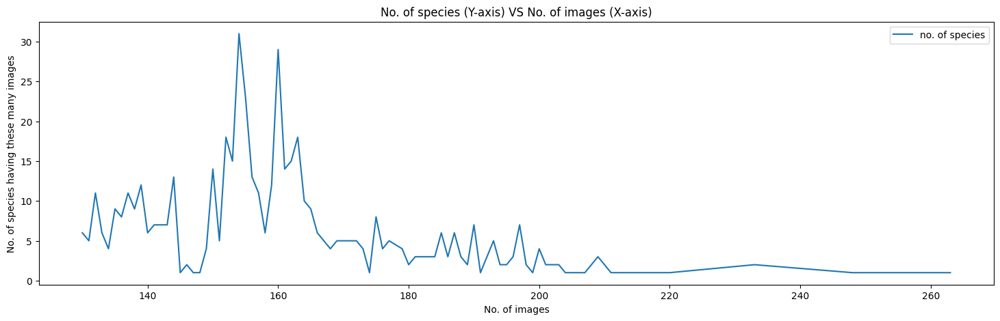

In [ ]:
df2 = df.groupby(by="quantity").count().reset_index().rename(columns={"species_name":"no. of species"})
df2.plot(kind="line",x="quantity",y="no. of species",figsize=(18,5),
         title="No. of species (Y-axis) VS No. of images (X-axis)",xlabel="No. of images",ylabel="No. of species having these many images")


Text(0.5, 0, 'Width')

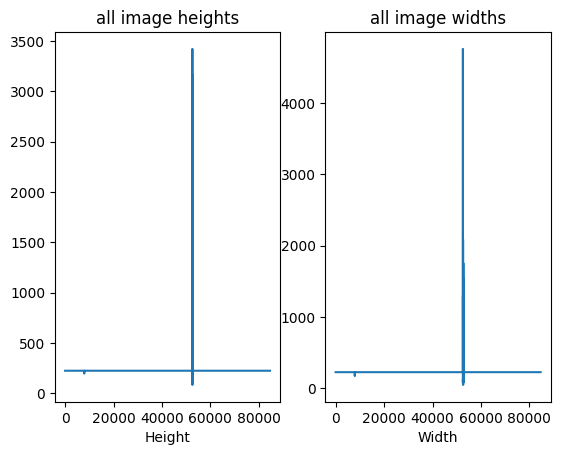

In [ ]:
plt.subplot(1,2,1)
sns.lineplot(data=train_images_heights)
plt.title("all image heights")
plt.xlabel("Height")

plt.subplot(1,2,2)
sns.lineplot(data=train_images_widths)
plt.title("all image widths")
plt.xlabel("Width")

In [ ]:
val_species_names,val_species_image_count,val_images_heights,val_images_widths = get_counts(dataset_path="/content/valid",dataset_type="validation")


100%|██████████| 525/525 [00:06<00:00, 86.48it/s] 


Total no. of species in validation= 525


<Axes: title={'center': 'No. of images (Y-axis) for each Species (X-axis) in validation dataset'}, xlabel='Species index', ylabel='No. of images'>

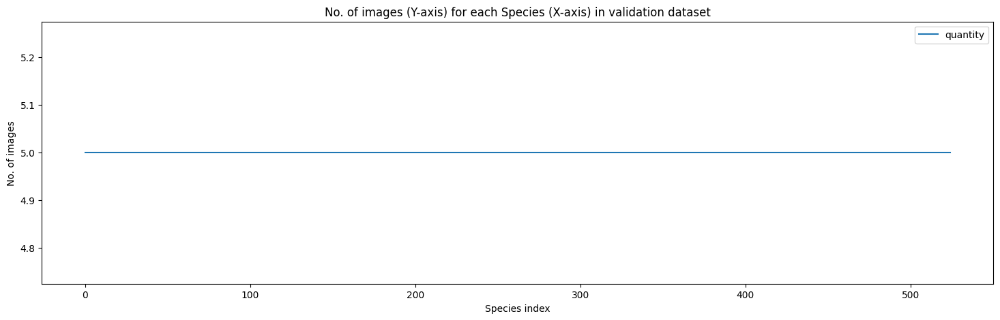

In [ ]:
df = pd.DataFrame({"species_name":val_species_names,
                   "quantity":val_species_image_count})
df.plot(kind="line",y="quantity",figsize=(18,5),title="No. of images (Y-axis) for each Species (X-axis) in validation dataset",ylabel="No. of images",xlabel="Species index")


Text(0.5, 0, 'Width')

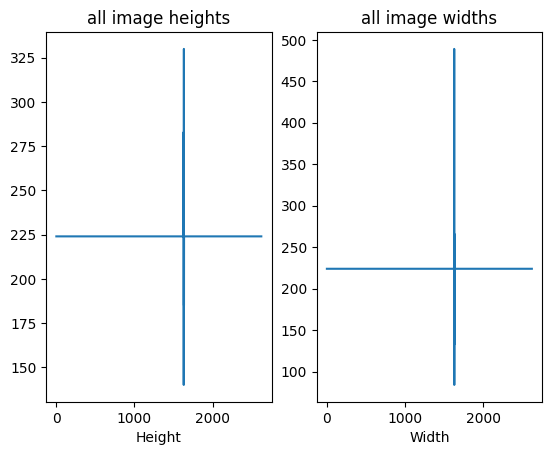

In [ ]:
plt.subplot(1,2,1)
sns.lineplot(data=val_images_heights)
plt.title("all image heights")
plt.xlabel("Height")

plt.subplot(1,2,2)
sns.lineplot(data=val_images_widths)
plt.title("all image widths")
plt.xlabel("Width")

In [ ]:
test_species_names,test_species_image_count,test_images_heights,test_images_widths = get_counts(dataset_path="/content/test",dataset_type="test")


100%|██████████| 525/525 [00:02<00:00, 182.28it/s]


Total no. of species in test= 525


<Axes: title={'center': 'No. of images (Y-axis) for each Species (X-axis) in test dataset'}, xlabel='Species index', ylabel='No. of images'>

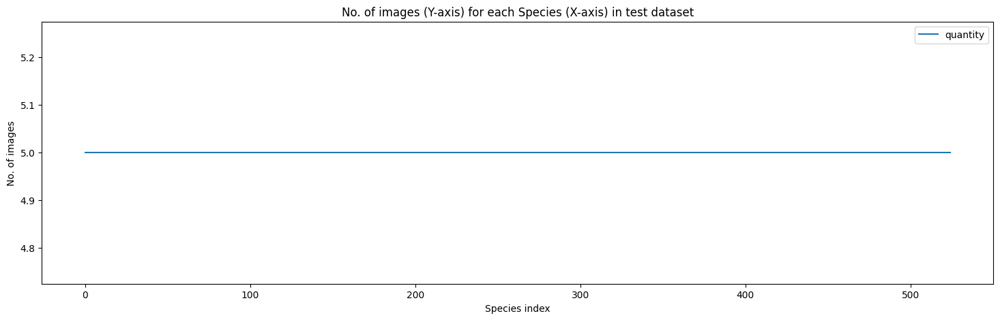

In [ ]:
df = pd.DataFrame({"species_name":test_species_names,
                   "quantity":test_species_image_count})
df.plot(kind="line",y="quantity",figsize=(18,5),title="No. of images (Y-axis) for each Species (X-axis) in test dataset",ylabel="No. of images",xlabel="Species index")


Text(0.5, 0, 'Width')

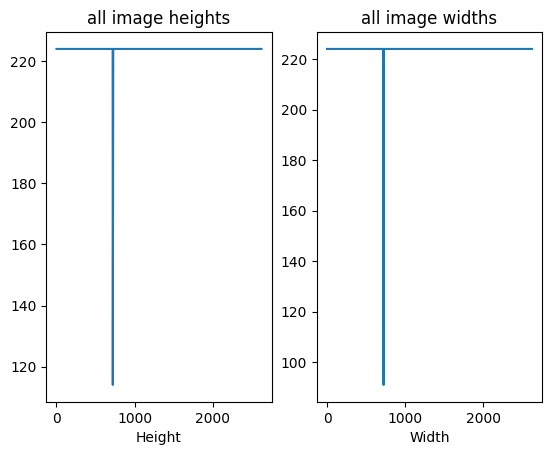

In [ ]:
plt.subplot(1,2,1)
sns.lineplot(data=test_images_heights)
plt.title("all image heights")
plt.xlabel("Height")

plt.subplot(1,2,2)
sns.lineplot(data=test_images_widths)
plt.title("all image widths")
plt.xlabel("Width")


In [ ]:
check = sorted(train_species_names) == sorted(val_species_names) == sorted(test_species_names)
print("Are all species names same in train, validation & test datasets? -->",check)

Are all species names same in train, validation & test datasets? --> False


In [ ]:
for i in train_species_names:
  if (i not in val_species_names) or (i not in test_species_names):
    print(i)

PARAKETT  AUKLET


In [ ]:
print("Performing set difference by subtracting the validation species names from train:-")
set(train_species_names).difference(set(val_species_names))

Performing set difference by subtracting the validation species names from train:-


{'PARAKETT  AUKLET'}

In [ ]:
print("Performing set difference by subtracting the train species names from validation:-")
set(val_species_names).difference(set(train_species_names))

Performing set difference by subtracting the train species names from validation:-


{'PARAKETT AUKLET'}

In [ ]:
print("Performing set difference by subtracting the train species names from test:-")
set(test_species_names).difference(set(train_species_names))

Performing set difference by subtracting the train species names from test:-


set()

In [ ]:
os.rename(src="/content/train/PARAKETT  AUKLET",dst="/content/train/PARAKETT AUKLET")


In [ ]:
check = sorted(os.listdir("/content/train/")) == sorted(os.listdir("/content/valid/")) == sorted(os.listdir("/content/test/"))
print("Are all species names same in train, validation & test datasets now? -->",check)

Are all species names same in train, validation & test datasets now? --> True


In [ ]:
import shutil

# Specify the paths to your datasets
train_path = 'train'
valid_path = 'valid'
test_path = 'test'

# Specify the folder to be removed
folder_to_remove = 'PARAKETT AUKLET'

# Remove the folder from the 'train' directory
shutil.rmtree(os.path.join(train_path, folder_to_remove), ignore_errors=True)

# Remove the folder from the 'valid' directory
shutil.rmtree(os.path.join(valid_path, folder_to_remove), ignore_errors=True)

# Remove the folder from the 'test' directory
shutil.rmtree(os.path.join(test_path, folder_to_remove), ignore_errors=True)



In [ ]:
import shutil

# Specify the paths to your datasets
train_path = 'train'
valid_path = 'valid'
test_path = 'test'

# Specify the folder to be removed
folder_to_remove = 'PARAKETT  AUKLET'

# Remove the folder from the 'train' directory
shutil.rmtree(os.path.join(train_path, folder_to_remove), ignore_errors=True)

# Remove the folder from the 'valid' directory
shutil.rmtree(os.path.join(valid_path, folder_to_remove), ignore_errors=True)

# Remove the folder from the 'test' directory
shutil.rmtree(os.path.join(test_path, folder_to_remove), ignore_errors=True)


In [ ]:
import os
from PIL import Image

def get_counts(dataset_path, dataset_type):
    species_names = []

    dataset_full_path = os.path.join(dataset_path, dataset_type)

    for folder_name in os.listdir(dataset_full_path):
        folder_path = os.path.join(dataset_full_path, folder_name)

        # Check if the path corresponds to a file
        if os.path.isdir(folder_path):  # Use os.path.isdir instead of os.path.isfile for directories
            try:
                # Assuming there is an image file in each folder, adjust the extension accordingly
                image_path = os.path.join(folder_path, os.listdir(folder_path)[0])
                img = Image.open(image_path)
                species_name = folder_name  # You may need to extract the species name based on your dataset structure
                species_names.append(species_name)
            except Exception as e:
                print(f"Error processing folder '{folder_name}': {e}")

    return species_names

# Example usage:
train_species_names = get_counts(dataset_path=".", dataset_type="train")
validation_species_names = get_counts(dataset_path=".", dataset_type="valid")
test_species_names = get_counts(dataset_path=".", dataset_type="test")

# Check if species names are the same in train, validation, and test datasets
are_species_names_same = set(train_species_names) == set(validation_species_names) == set(test_species_names)
print(f"Are all species names the same in train, validation, and test datasets now? --> {are_species_names_same}")


Are all species names the same in train, validation, and test datasets now? --> True


<ipython-input-38-ae3a37d647b4>:8: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(5,5,col)


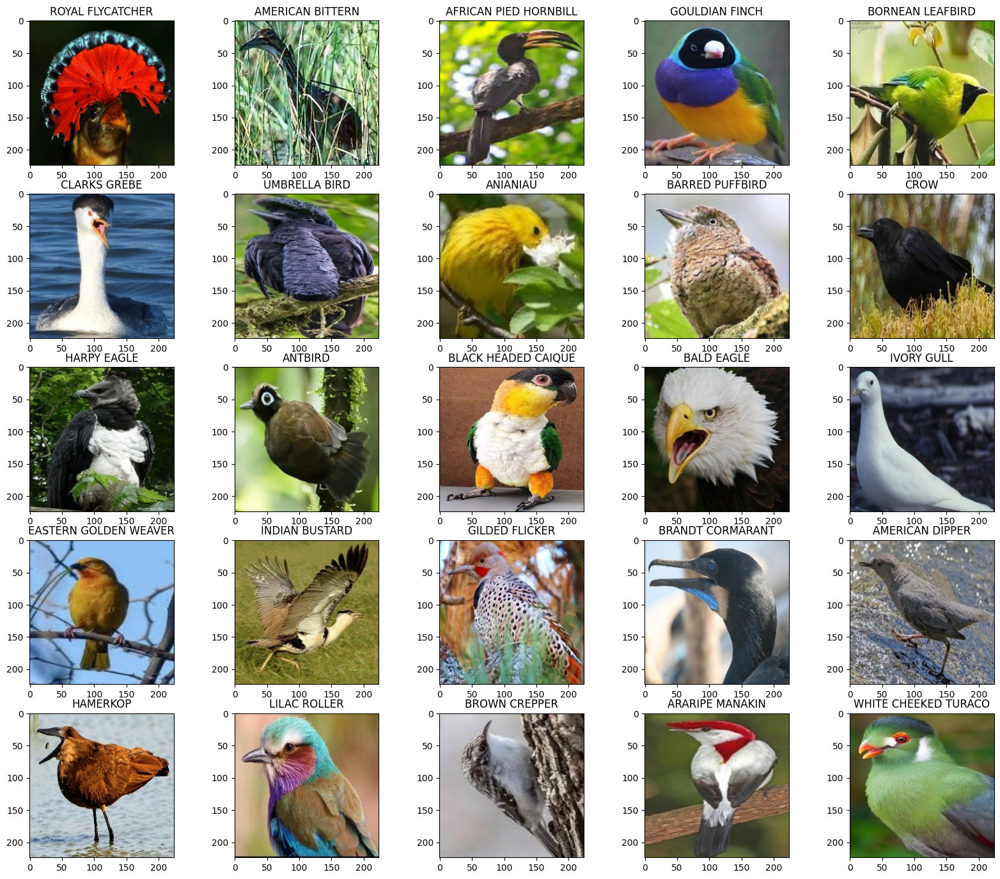

In [ ]:
# PRINT SOME RANDOMLY SELECTED 25 IMAGES FROM THE TRAIN FOLDER
parent_dir = "/content/train/"
all_subdirs = os.listdir(parent_dir)

plt.subplots(figsize=(20,17))

for col in range(1,26):
  plt.subplot(5,5,col)
  chosen_species_dir = all_subdirs[random.randint(0,349)]
  chosen_dir = parent_dir + chosen_species_dir
  all_images_in_chosen_dir = os.listdir(chosen_dir)
  chosen_img = chosen_dir + "/" + all_images_in_chosen_dir[random.randint(0,len(all_images_in_chosen_dir)-1)]
  image = imread(chosen_img)
  plt.title(chosen_species_dir)
  plt.imshow(image)

In [ ]:
def get_augmented_sample(datagen):
  it = datagen.flow(img,batch_size=1)
  plt.figure(figsize=(20,5))
  for i in range(1,6):
    plt.subplot(1,5,i)
    # valid range for matplotlib imshow with RGB data --> ([0..1] for floats or [0..255] for integers)
    # Hence, we need to convert the image array to uint8
    # uint8 is an unsigned 8-bit integer that can represent values 0.. 255
    plt.imshow(it.next()[0].astype('uint8'))
  plt.show()

The Actual Image


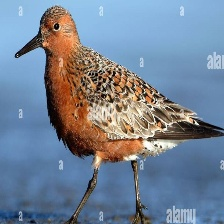

In [ ]:
# SAMPLE IMAGE --> a RED HONEY CREEPER
path = "/content/train/RED KNOT/013.jpg"

sample = load_img(path=path)
img = np.expand_dims(sample,0)
print("The Actual Image")
sample

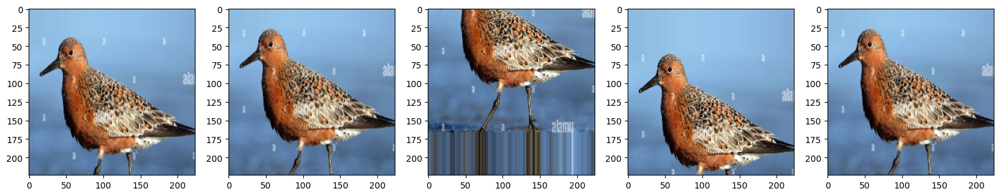

In [ ]:
dgen = ImageDataGenerator(width_shift_range=[0.1,0.15,0.2,0.25])
get_augmented_sample(dgen)

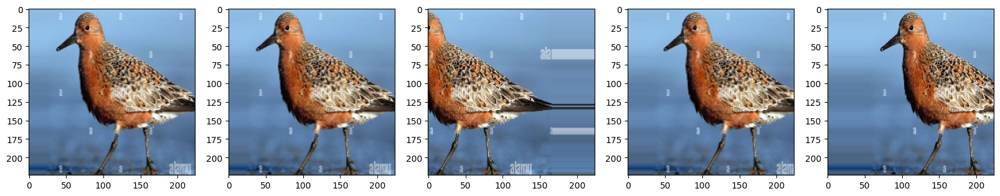

In [ ]:
dgen = ImageDataGenerator(height_shift_range=[0.1,0.15,0.2,0.25])
get_augmented_sample(dgen)

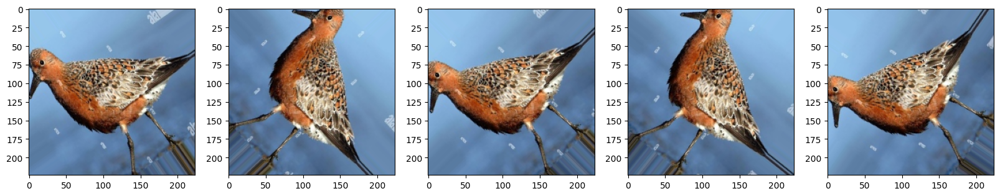

In [ ]:
dgen = ImageDataGenerator(rotation_range=60)
get_augmented_sample(dgen)

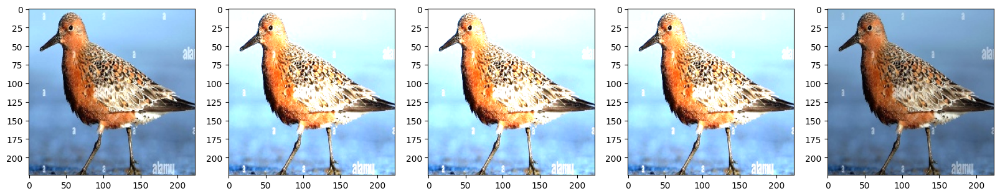

In [ ]:
dgen = ImageDataGenerator(brightness_range=[0.5,1.9])
get_augmented_sample(dgen)

In [ ]:
from keras.preprocessing.image import ImageDataGenerator

# Specify the paths to your datasets
train_path = "train"
valid_path = "valid"
test_path = "test"

# Specify the batch size and image size
batch_size = 32
img_size = (224, 224)

# Create ImageDataGenerator for each dataset
train_datagen = ImageDataGenerator()
valid_datagen = ImageDataGenerator()
test_datagen = ImageDataGenerator()

# Create flow_from_directory for each dataset
train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

valid_generator = valid_datagen.flow_from_directory(
    valid_path,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Print the number of classes in each dataset
print(f"Number of classes in train dataset: {train_generator.num_classes}")
print(f"Number of classes in validation dataset: {valid_generator.num_classes}")
print(f"Number of classes in test dataset: {test_generator.num_classes}")


Found 84480 images belonging to 524 classes.
Found 2620 images belonging to 524 classes.
Found 2620 images belonging to 524 classes.
Number of classes in train dataset: 524
Number of classes in validation dataset: 524
Number of classes in test dataset: 524


In [ ]:
from keras.preprocessing.image import ImageDataGenerator

# Specify the paths to your datasets
train_path = "train"
valid_path = "valid"
test_path = "test"

# Specify the batch size and image size
batch_size = 32
img_size = (224, 224)

# Create ImageDataGenerator for each dataset
train_datagen = ImageDataGenerator()
valid_datagen = ImageDataGenerator()
test_datagen = ImageDataGenerator()

# Create flow_from_directory for each dataset
train_generator = train_datagen.flow_from_directory(
    train_path,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

valid_generator = valid_datagen.flow_from_directory(
    valid_path,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

test_generator = test_datagen.flow_from_directory(
    test_path,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Identify the extra class in the train dataset
extra_class_train = set(train_generator.class_indices.keys()) - set(valid_generator.class_indices.keys())
print(f"Extra class in train dataset: {extra_class_train}")

# Print the number of classes in each dataset
print(f"Number of classes in train dataset: {train_generator.num_classes}")
print(f"Number of classes in validation dataset: {valid_generator.num_classes}")
print(f"Number of classes in test dataset: {test_generator.num_classes}")


Found 84480 images belonging to 524 classes.
Found 2620 images belonging to 524 classes.
Found 2620 images belonging to 524 classes.
Extra class in train dataset: set()
Number of classes in train dataset: 524
Number of classes in validation dataset: 524
Number of classes in test dataset: 524


In [ ]:
import os
import shutil

# Specify the path to your train dataset
train_path = "train"

# Specify the name of the folder to be removed
extra_class_folder = "corrected_folder_name"

# Full path to the folder
folder_path = os.path.join(train_path, extra_class_folder)

# Remove the folder
shutil.rmtree(folder_path)

print(f"Folder '{extra_class_folder}' has been removed.")


Folder 'corrected_folder_name' has been removed.


In [ ]:
datagen1 = ImageDataGenerator(rescale=1/255)


In [ ]:
datagen2 = ImageDataGenerator(rescale=1/255,width_shift_range=[0.1,0.15,0.2,0.25],height_shift_range=[0.1,0.15,0.2,0.25],
                              rotation_range=60,brightness_range=[0.5,1.9],horizontal_flip=True,shear_range=45,zoom_range=[0.6,1.2])


In [ ]:
def non_transfer_learning_iterator(batch_size,img_w,img_h,train_iterator_type):
  BATCH_SIZE=batch_size
  TARGET_SIZE=(img_w,img_h)

  path1 = "/content/train"
  path2 = "/content/valid"
  path3 = "/content/test"

  # VALIDATION,TEST ITERATORS
  validation_it = datagen1.flow_from_directory(path2,class_mode="categorical",batch_size=BATCH_SIZE,target_size=TARGET_SIZE)
  test_it = datagen1.flow_from_directory(path3,class_mode="categorical",batch_size=BATCH_SIZE,target_size=TARGET_SIZE)

  # TRAIN ITERATOR WITH/WITHOUT AUGMENTATION
  if train_iterator_type=="1":  # won't augment
    train_it = datagen1.flow_from_directory(path1,class_mode="categorical",batch_size=BATCH_SIZE,target_size=TARGET_SIZE)
  elif train_iterator_type=="2":  # will augment
    train_it = datagen2.flow_from_directory(path1,class_mode="categorical",batch_size=BATCH_SIZE,target_size=TARGET_SIZE)

  return train_it,validation_it,test_it

In [ ]:
def transfer_learning_iterator(prep_func,batch_size,img_w,img_h,aug=False):
  """Returns separate image data generators for train and validation/test sets for different transfer learning approaches.
  This function will be called when transfer learning will be done."""
  BATCH_SIZE=batch_size
  TARGET_SIZE=(img_w,img_h)
  path1 = "/content/train"
  path2 = "/content/valid"
  path3 = "/content/test"

  datagen = ImageDataGenerator(rescale=1/255,preprocessing_function=prep_func)  # no augmentation will be performed

  # VALIDATION,TEST ITERATORS
  validation_it = datagen.flow_from_directory(path2,class_mode="categorical",batch_size=BATCH_SIZE,target_size=TARGET_SIZE)
  test_it = datagen.flow_from_directory(path3,class_mode="categorical",batch_size=BATCH_SIZE,target_size=TARGET_SIZE)

  if aug==True:
    datagen = ImageDataGenerator(rescale=1/255,width_shift_range=[0.1,0.15,0.2,0.25],height_shift_range=[0.1,0.15,0.2,0.25],
                                 rotation_range=60,brightness_range=[0.5,1.9],horizontal_flip=True,shear_range=45,zoom_range=[0.6,1.2],
                                 preprocessing_function=prep_func)

  train_it = datagen.flow_from_directory(path1,class_mode="categorical",batch_size=BATCH_SIZE,target_size=TARGET_SIZE)

  return train_it,validation_it,test_it

In [ ]:
def predict_bird_species(img_path,img_width,img_height,actual_species_name,best_model,tf_lr=False,prep_func=None):
  """This function helps us to visualize the model's predictions a.k.a thoughts"""
  plt.subplots(figsize=(20,5))

  # load the image
  img = load_img(img_path, target_size=(img_width,img_height))  # (img_width,img_height,3)

  plt.subplot(1,6,1)
  title_text = "Actual Species:",actual_species_name
  plt.title(title_text,fontsize=8)
  plt.imshow(img)

  # convert to array
  img = img_to_array(img) # (img_width,img_height,3)

  # modify as per the pre-defined model being fed
  if tf_lr == True:
    img = prep_func(img)

  # add batch size as a dimension
  img = np.expand_dims(img, axis=0)  #(1,img_width,img_height,3)

  prediction_probability = best_model.predict(img)
  sorted_preds = np.sort(prediction_probability)[0][::-1]
  top5preds = np.argsort(prediction_probability)[0][::-1][:5]

  all_species = {v:k for k,v in train_it.class_indices.items()}
  print("Top 5 species & the probabilities with which the model thinks that this bird belongs to:-")
  for i in range(len(top5preds)):
    pred_species = all_species.get(top5preds[i])
    other_img = load_img("/content/test/"+pred_species+"/1.jpg", target_size=(img_width,img_height))

    plt.subplot(1,6,i+2)
    title_text = pred_species + ":" + str(sorted_preds[i])
    plt.title(title_text,fontsize=8)
    plt.imshow(other_img)

In [ ]:
clear_session()
set_random_seed(42)
img_width,img_height=96,96
BATCH_SIZE = 256
train_it,validation_it,test_it = non_transfer_learning_iterator(batch_size=BATCH_SIZE,img_w=img_width,img_h=img_height,train_iterator_type="1")
model_id="1"

input_layer = Input(shape=(img_width,img_height,3), name="main_input_layer")
conv = SeparableConv2D(filters=256,kernel_size=(3,3), padding='same',depth_multiplier=1,activation="relu",use_bias=True,
                       depthwise_initializer='he_uniform',pointwise_initializer='he_uniform',bias_initializer='zeros')(input_layer)
mpool = MaxPooling2D(pool_size=(2,2))(conv)
conv = SeparableConv2D(filters=256,kernel_size=(3,3), padding='same',depth_multiplier=1,activation="relu",use_bias=True,
                       depthwise_initializer='he_uniform',pointwise_initializer='he_uniform',bias_initializer='zeros')(mpool)
mpool = MaxPooling2D(pool_size=(2,2))(conv)
flat = Flatten()(mpool)
dense = Dense(units=128,activation="relu",kernel_initializer="he_uniform")(flat)
output_layer = Dense(units=524,activation="softmax")(dense)

model1 = Model(inputs=input_layer,outputs=output_layer)
model1.compile(optimizer="adam",loss="categorical_crossentropy")

Found 2620 images belonging to 524 classes.
Found 2620 images belonging to 524 classes.
Found 84480 images belonging to 524 classes.


In [ ]:
print(train_it.class_indices)


{'ABBOTTS BABBLER': 0, 'ABBOTTS BOOBY': 1, 'ABYSSINIAN GROUND HORNBILL': 2, 'AFRICAN CROWNED CRANE': 3, 'AFRICAN EMERALD CUCKOO': 4, 'AFRICAN FIREFINCH': 5, 'AFRICAN OYSTER CATCHER': 6, 'AFRICAN PIED HORNBILL': 7, 'AFRICAN PYGMY GOOSE': 8, 'ALBATROSS': 9, 'ALBERTS TOWHEE': 10, 'ALEXANDRINE PARAKEET': 11, 'ALPINE CHOUGH': 12, 'ALTAMIRA YELLOWTHROAT': 13, 'AMERICAN AVOCET': 14, 'AMERICAN BITTERN': 15, 'AMERICAN COOT': 16, 'AMERICAN DIPPER': 17, 'AMERICAN FLAMINGO': 18, 'AMERICAN GOLDFINCH': 19, 'AMERICAN KESTREL': 20, 'AMERICAN PIPIT': 21, 'AMERICAN REDSTART': 22, 'AMERICAN ROBIN': 23, 'AMERICAN WIGEON': 24, 'AMETHYST WOODSTAR': 25, 'ANDEAN GOOSE': 26, 'ANDEAN LAPWING': 27, 'ANDEAN SISKIN': 28, 'ANHINGA': 29, 'ANIANIAU': 30, 'ANNAS HUMMINGBIRD': 31, 'ANTBIRD': 32, 'ANTILLEAN EUPHONIA': 33, 'APAPANE': 34, 'APOSTLEBIRD': 35, 'ARARIPE MANAKIN': 36, 'ASHY STORM PETREL': 37, 'ASHY THRUSHBIRD': 38, 'ASIAN CRESTED IBIS': 39, 'ASIAN DOLLARD BIRD': 40, 'ASIAN GREEN BEE EATER': 41, 'ASIAN OPENBILL

In [ ]:
log_dir="/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/tblogs/"
cb1 = TensorBoard(log_dir=log_dir,histogram_freq=1, write_graph=True)

f_path = "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-"+model_id+"/save_model/weights-{epoch:02d}-{val_loss:.4f}.h5"
cb2 = ModelCheckpoint(filepath=f_path, monitor='val_loss', verbose=1, save_best_only=True, mode="auto")

cb3 = EarlyStopping(monitor="val_loss",patience=2,verbose=1)

In [59]:
%%time
set_random_seed(42)

history = model1.fit(train_it,steps_per_epoch=len(train_it),
                    validation_data=validation_it,validation_steps=len(validation_it),
                    epochs=5,callbacks=[cb1,cb2,cb3])

Epoch 1/5
330/330 [==============================] - ETA: 0s - loss: 2.5815
Epoch 1: val_loss did not improve from 3.45233
330/330 [==============================] - 139s 418ms/step - loss: 2.5815 - val_loss: 3.6429
Epoch 2/5
330/330 [==============================] - ETA: 0s - loss: 2.4226
Epoch 2: val_loss did not improve from 3.45233
330/330 [==============================] - 137s 416ms/step - loss: 2.4226 - val_loss: 3.7563
Epoch 3/5
330/330 [==============================] - ETA: 0s - loss: 2.2684
Epoch 3: val_loss did not improve from 3.45233
330/330 [==============================] - 138s 416ms/step - loss: 2.2684 - val_loss: 3.8446
Epoch 3: early stopping
CPU times: user 8min 56s, sys: 33.3 s, total: 9min 30s
Wall time: 6min 55s


In [60]:
print("Loss on Completely unseen test dataset:-")
model1.evaluate(test_it)

Loss on Completely unseen test dataset:-
11/11 [==============================] - 4s 335ms/step - loss: 3.5586


3.558579206466675

<ipython-input-52-cd14b2dc4f1b>:8: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1,6,1)


1/1 [==============================] - 0s 463ms/step
Top 5 species & the probabilities with which the model thinks that this bird belongs to:-


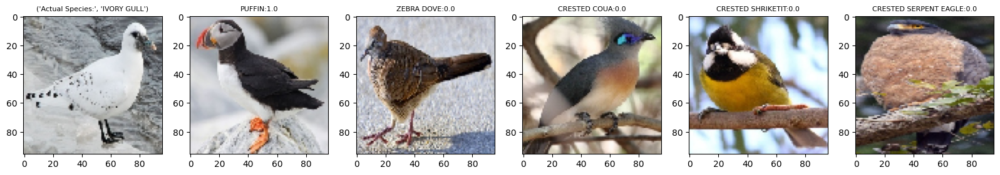

In [64]:
m = load_model("/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-1/save_model/weights-09-3.4523.h5")

predict_bird_species(img_path="/content/test/IVORY GULL/4.jpg",img_width=96,img_height=96,
                     actual_species_name="IVORY GULL",best_model=m)

In [65]:
%tensorboard --logdir "/content/drive/MyDrive/AAIC - Assignments/SNo.32_Self Case Study 2/ALL_MODELS/model-1/tblogs/"

<IPython.core.display.Javascript object>

In [68]:
###model 2